# Drug interaction prediction in *E. coli*
*Author: Vladislav Kim*
* [Introduction](#intro)
* [Compound class stratified validation](#classlockout)
* [Choose thresholds for interactions](#threshclass)
* [Precision-recall and ROC curves](#pr)
* [Probability calibration](#calib)
* [Predictions on the test set](#test)

In [1]:
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib
import tensorflow as tf
import numpy as np
import pandas as pd
import sys
import os
import itertools
from sklearn.preprocessing import label_binarize

sys.path.append('..')
import base.chemgen_utils as utl
import MLmod.predictor_modified as prd

In [2]:
from sklearn.model_selection import ParameterGrid
# # DL has 10 * 10 * 5 * 5 * 5 * 10 * 10 = 2880 combinations of hyperparameters
# DL_grid1 = {"learning_rate_deep": [0.001,0.005,0.01,0.1,1],
#              "layers": [1,3,5,7],
#              "nodes": [16,32,64,128],
#              "dropout": [0.1,0.3,0.5,0.7],
#              "steps": [32,64,128],
#              "epochs": [400, 600, 800]}
#              #"class_weight": {0:1, 1:2, 2:10}

#     # DL has 10 * 10 * 5 * 5 * 5 * 10 * 10 = 576 combinations of hyperparameters
# DL_grid2 = {"learning_rate_deep": [0.0001,0.001],
#              "layers": [1,3],
#              "nodes": [64,128,256],
#              "dropout": [0.1,0.5],
#              "steps": [64,128],
#              "beta_1": [0.8, 0.99],
#              "beta_2": [0.9, 0.99],
#              "epochs": [400, 600, 800]}
#              #"class_weight": {0:1, 1:2, 2:10} 

# DL has 10 * 10 * 5 * 5 * 5 * 10 * 10 = 1296 combinations of hyperparameters
DL_grid3 = {"learning_rate_deep": [0.0001,0.001],
             "layers": [1,3],
             "nodes": [64,128,256],
             "dropout": [0.1,0.3, 0.5],
             "steps": [64,128],
             "beta_1": [0.8, 0.9, 0.99],
             "beta_2": [0.9, 0.99,0.999],
             "epochs": [600, 800]}
             #"class_weight": {0:1, 1:2, 2:10}

pgrid = ParameterGrid(DL_grid3)
indices = np.array_split(np.arange(len(pgrid)), 1296)

print(pgrid[293])

{'steps': 128, 'nodes': 256, 'learning_rate_deep': 0.0001, 'layers': 1, 'epochs': 600, 'dropout': 0.1, 'beta_2': 0.999, 'beta_1': 0.8}


In [3]:
# import matplotlib.pyplot as plt
# from matplotlib import cm
# import matplotlib
# import tensorflow as tf
# import numpy as np
# import pandas as pd
# import sys
# import os
# import itertools
# from sklearn.preprocessing import label_binarize

# sys.path.append('..')
# import base.chemgen_utils as utl
# import MLmod.predictor_modified as prd

<a id="intro"></a> 
## Introduction
It has been previously shown that drug interactions can be predicted in bacteria using chemogenomic data. Here we use random forest classifier on single-compound chemical genetics data in *E. coli* to predict antagonisms, synergies and additive combinations. 

We encode our input predictor matrix as follows: 
+ For each combination load single-compound profiles. Each profile has dimensions `(1 x genes)` and the following possible gene states {-1,0,+1}. Negative drug-gene interaction (-1) implies increased sensitivity in that gene deletion, while positive gene state (+1) indicates decreased sensitivity in that mutant
+ Combination profiles are generaeted based on superposition of individual drug profiles and may take on the following gene states {-2, -1, 0, +1, +2, +/-}
+ We then use one-hot encoding scheme ("dummy variable encoding") before passing the predictor matrix `X` to the classifier

We furthermore subset the data so that only those genes are included that are significantly enriched in antagonisms and synergies based on chi-squared test. This gene list is `interaction-genes-Ecoli`

In [4]:
drugleg_fname = "../data/chemicals/legend_gramnegpos.txt"
#gene_subset = '../data/interaction-genes-Ecoli'
gene_subset = '../data/interaction-genes-Salmonella'
gene_subset = pd.read_csv(gene_subset, header=None)[0].values

In [5]:
#X_chemgen = pd.read_csv('../data/chemgenetics/nichols_signed.csv', index_col=0)
X_chemgen = pd.read_csv('../data/chemgenetics/salmonella_signed.csv', index_col=0)

X_chemgen = X_chemgen.iloc[:,np.where(np.isin(X_chemgen.columns, gene_subset))[0]]
#targets = pd.read_csv("../data/chemgenetics/nichols_y.csv")
targets = pd.read_csv("../data/chemgenetics/salmonella_y.csv")
combs = targets['comb'].values
y = targets['type'].values

X_df = pd.DataFrame([utl.get_comb_feat_signed(X_chemgen, c) for c in combs])

Since we are using `OneVsRestClassifier`, we convert our categorical response variable `y` ("synergy" ,"antagonism", "none") into a `n x 3` binary array using `label_binarize` function

In [6]:
# one vs rest classification
y[y=='none'] = 0
y[y=='antagonism']=1
y[y=='synergy']=2

y=y.astype('int')
y = label_binarize(y, classes=[0, 1, 2])

Encode combination profiles using one-hot encoding scheme:

In [7]:
X_onehot = pd.get_dummies(X_df.astype('category'))

In [8]:
X_onehot.iloc[:6,:12]

,acnB_-2,acnB_-1,acnB_0,acnB_1,acnB_2,acnB_3,acrB_-2,acrB_-1,acrB_0,ampD_-1,ampD_0,ampD_1
0,0,0,1,0,0,0,0,0,1,0,0,1
1,0,0,1,0,0,0,0,1,0,0,0,1
2,0,0,1,0,0,0,0,1,0,0,0,1
3,0,0,1,0,0,0,0,0,1,0,0,1
4,0,0,1,0,0,0,0,0,1,0,0,0
5,0,0,1,0,0,0,0,1,0,0,0,1


In [9]:
# at least 5 combinations with that variable set
X_onehot = X_onehot.loc[:,(X_onehot.sum(axis=0) > 4)]

We performed grid search to find the best parameters for the `RandomForestClassifier`:

In [10]:
# best parameters when sorted by meanAP_syn, meanAP_antag
#param_dict = {'n_estimators': 200,
# 'min_samples_split': 6,
# 'min_samples_leaf': 2,
# 'max_depth': None,
# 'class_weight': {0: 1, 1: 1}}

In [11]:
# best parameters neural network
param_dict = {
'steps': 128,
'nodes': 256,
'learning_rate_deep': 0.0001,
'layers': 1,
'epochs': 600,
'dropout': 0.1,
'beta_2': 0.999,
'beta_1': 0.8,
'class_weight': None}

#Salmonella{'steps': 128, 'nodes': 256, 'learning_rate_deep': 0.0001, 'layers': 1, 'epochs': 600, 'dropout': 0.1, 'beta_2': 0.999, 'beta_1': 0.8}
#Ecoli{'steps': 64, 'nodes': 256, 'learning_rate_deep': 0.0001, 'layers': 1, 'epochs': 600, 'dropout': 0.5, 'beta_2': 0.999, 'beta_1': 0.8}

<a id="classlockout"></a> 
## Cross Validation
In order to assess the generalization error we generate 20 cross-validation folds by withholding 15 randomly chosen compounds.

In [12]:
'''from sklearn.model_selection import KFold, RepeatedKFold

kf = RepeatedKFold(n_splits=10, n_repeats=2, random_state=1401)
splits = kf.split(X=X_onehot.to_numpy(),y=y)'''

'from sklearn.model_selection import KFold, RepeatedKFold\n\nkf = RepeatedKFold(n_splits=10, n_repeats=2, random_state=1401)\nsplits = kf.split(X=X_onehot.to_numpy(),y=y)'

In [13]:
def generate_train_val(drugs, combs, n_holdout=15):
    val_drugs = np.random.choice(drugs, size=n_holdout)
    
    combs_val = list(itertools.combinations(val_drugs, 2))
    combs_val = [sorted(i) for i in combs_val]
    combs_val = np.array([i[0]+"_"+i[1] for i in combs_val])
    combs_val = np.intersect1d(combs_val, combs)
    combs_train = np.setdiff1d(combs, combs_val)
    
    assert((combs_train.shape[0] + combs_val.shape[0]) == combs.shape[0])
    train = np.where(np.isin(combs, combs_train))[0]
    val = np.where(np.isin(combs, combs_val))[0]
    return (train, val)

In [14]:
np.random.seed(1601)
# drugs in the chemical genetics dataset of E. coli
drugs = np.unique(X_chemgen.index)
# generate CV folds by withholding 15 randomly chosen drugs
splits = [generate_train_val(drugs, combs) for i in range(20)]

In each cross-validation iteration we withhold a random subset of drugs $(n=15)$ and test the trained model on the withheld combinations:

In [15]:
pr = prd.MultiClassPredictions(X=X_onehot.to_numpy(), y=y,
                                   combs=combs,
                                  **param_dict,
                                   clf='neural_network',
                                   top = 30)

In [16]:
pr.crossval_ksplit(splits=splits)

Validation set size in CV fold 1: 77
Epoch 1/600
128/128 [==============================] - 0s 803us/step - loss: 0.5608 - accuracy: 0.8131
Epoch 2/600
128/128 [==============================] - 0s 813us/step - loss: 0.4068 - accuracy: 0.8393
Epoch 3/600
128/128 [==============================] - 0s 827us/step - loss: 0.3575 - accuracy: 0.8561
Epoch 4/600
128/128 [==============================] - 0s 786us/step - loss: 0.3394 - accuracy: 0.8751
Epoch 5/600
128/128 [==============================] - 0s 781us/step - loss: 0.3291 - accuracy: 0.8622
Epoch 6/600
128/128 [==============================] - 0s 843us/step - loss: 0.3266 - accuracy: 0.8627
Epoch 7/600
128/128 [==============================] - 0s 842us/step - loss: 0.3083 - accuracy: 0.8665
Epoch 8/600
128/128 [==============================] - 0s 955us/step - loss: 0.3138 - accuracy: 0.8652
Epoch 9/600
128/128 [==============================] - 0s 866us/step - loss: 0.3021 - accuracy: 0.8748
Epoch 10/600
128/128 [==============

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Validation set size in CV fold 2: 102
Epoch 1/600
128/128 [==============================] - 0s 1ms/step - loss: 0.7074 - accuracy: 0.7003
Epoch 2/600
128/128 [==============================] - 0s 2ms/step - loss: 0.4042 - accuracy: 0.8444
Epoch 3/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3870 - accuracy: 0.8425
Epoch 4/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3648 - accuracy: 0.8401
Epoch 5/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3211 - accuracy: 0.8685
Epoch 6/600
128/128 [==============================] - 0s 997us/step - loss: 0.3298 - accuracy: 0.8569
Epoch 7/600
128/128 [==============================] - 0s 950us/step - loss: 0.3168 - accuracy: 0.8710
Epoch 8/600
128/128 [==============================] - 0s 927us/step - loss: 0.3025 - accuracy: 0.8793
Epoch 9/600
128/128 [==============================] - 0s 916us/step - loss: 0.2894 - accuracy: 0.8797
Epoch 10/600
128/128 [=======================

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
128/128 [==============================] - 0s 977us/step - loss: 0.5575 - accuracy: 0.7875
Epoch 2/600
128/128 [==============================] - 0s 959us/step - loss: 0.3971 - accuracy: 0.8352
Epoch 3/600
128/128 [==============================] - 0s 962us/step - loss: 0.3571 - accuracy: 0.8568
Epoch 4/600
128/128 [==============================] - 0s 953us/step - loss: 0.3511 - accuracy: 0.8452
Epoch 5/600
128/128 [==============================] - 0s 949us/step - loss: 0.3500 - accuracy: 0.8529
Epoch 6/600
128/128 [==============================] - 0s 977us/step - loss: 0.3390 - accuracy: 0.8526
Epoch 7/600
128/128 [==============================] - 0s 965us/step - loss: 0.3122 - accuracy: 0.8652
Epoch 8/600
128/128 [==============================] - 0s 972us/step - loss: 0.3119 - accuracy: 0.8797
Epoch 9/600
128/128 [==============================] - 0s 981us/step - loss: 0.2944 - accuracy: 0.8831
Epoch 10/600
128/128 [==============================] - 0s 966us/step - l

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
128/128 [==============================] - 0s 983us/step - loss: 0.4768 - accuracy: 0.8370
Epoch 2/600
128/128 [==============================] - 0s 971us/step - loss: 0.3859 - accuracy: 0.8475
Epoch 3/600
128/128 [==============================] - 0s 961us/step - loss: 0.3605 - accuracy: 0.8489
Epoch 4/600
128/128 [==============================] - 0s 971us/step - loss: 0.3289 - accuracy: 0.8625
Epoch 5/600
128/128 [==============================] - 0s 966us/step - loss: 0.3280 - accuracy: 0.8533
Epoch 6/600
128/128 [==============================] - 0s 965us/step - loss: 0.3368 - accuracy: 0.8572
Epoch 7/600
128/128 [==============================] - 0s 970us/step - loss: 0.2817 - accuracy: 0.8837
Epoch 8/600
128/128 [==============================] - 0s 960us/step - loss: 0.2923 - accuracy: 0.8777
Epoch 9/600
128/128 [==============================] - 0s 969us/step - loss: 0.2881 - accuracy: 0.8746
Epoch 10/600
128/128 [==============================] - 0s 1ms/step - los

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
128/128 [==============================] - 0s 935us/step - loss: 0.5398 - accuracy: 0.8044
Epoch 2/600
128/128 [==============================] - 0s 895us/step - loss: 0.4084 - accuracy: 0.8361
Epoch 3/600
128/128 [==============================] - 0s 929us/step - loss: 0.3420 - accuracy: 0.8612
Epoch 4/600
128/128 [==============================] - 0s 891us/step - loss: 0.3376 - accuracy: 0.8624
Epoch 5/600
128/128 [==============================] - 0s 906us/step - loss: 0.3175 - accuracy: 0.8687
Epoch 6/600
128/128 [==============================] - 0s 903us/step - loss: 0.3043 - accuracy: 0.8730
Epoch 7/600
128/128 [==============================] - 0s 888us/step - loss: 0.2972 - accuracy: 0.8792
Epoch 8/600
128/128 [==============================] - 0s 885us/step - loss: 0.3067 - accuracy: 0.8618
Epoch 9/600
128/128 [==============================] - 0s 909us/step - loss: 0.2946 - accuracy: 0.8751
Epoch 10/600
128/128 [==============================] - 0s 936us/step - l

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
128/128 [==============================] - 0s 981us/step - loss: 0.4858 - accuracy: 0.8410
Epoch 2/600
128/128 [==============================] - 0s 967us/step - loss: 0.3616 - accuracy: 0.8614
Epoch 3/600
128/128 [==============================] - 0s 991us/step - loss: 0.3361 - accuracy: 0.8640
Epoch 4/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3392 - accuracy: 0.8549
Epoch 5/600
128/128 [==============================] - 0s 984us/step - loss: 0.3154 - accuracy: 0.8672
Epoch 6/600
128/128 [==============================] - 0s 965us/step - loss: 0.3129 - accuracy: 0.8658
Epoch 7/600
128/128 [==============================] - 0s 984us/step - loss: 0.2852 - accuracy: 0.8774
Epoch 8/600
128/128 [==============================] - 0s 969us/step - loss: 0.3131 - accuracy: 0.8601
Epoch 9/600
128/128 [==============================] - 0s 975us/step - loss: 0.2833 - accuracy: 0.8768
Epoch 10/600
128/128 [==============================] - 0s 996us/step - los

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
128/128 [==============================] - 0s 981us/step - loss: 0.5542 - accuracy: 0.8016
Epoch 2/600
128/128 [==============================] - 0s 965us/step - loss: 0.4034 - accuracy: 0.8465
Epoch 3/600
128/128 [==============================] - 0s 960us/step - loss: 0.3768 - accuracy: 0.8499
Epoch 4/600
128/128 [==============================] - 0s 975us/step - loss: 0.3438 - accuracy: 0.8574
Epoch 5/600
128/128 [==============================] - 0s 980us/step - loss: 0.3151 - accuracy: 0.8732
Epoch 6/600
128/128 [==============================] - 0s 973us/step - loss: 0.3316 - accuracy: 0.8504
Epoch 7/600
128/128 [==============================] - 0s 959us/step - loss: 0.2985 - accuracy: 0.8824
Epoch 8/600
128/128 [==============================] - 0s 961us/step - loss: 0.3001 - accuracy: 0.8697
Epoch 9/600
128/128 [==============================] - 0s 953us/step - loss: 0.2928 - accuracy: 0.8766
Epoch 10/600
128/128 [==============================] - 0s 972us/step - l

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Validation set size in CV fold 8: 88
Epoch 1/600
128/128 [==============================] - 0s 1ms/step - loss: 0.6093 - accuracy: 0.7314
Epoch 2/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3732 - accuracy: 0.8541
Epoch 3/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3473 - accuracy: 0.8630
Epoch 4/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3323 - accuracy: 0.8627
Epoch 5/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3451 - accuracy: 0.8583
Epoch 6/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3184 - accuracy: 0.8720
Epoch 7/600
128/128 [==============================] - 0s 1ms/step - loss: 0.2911 - accuracy: 0.8720
Epoch 8/600
128/128 [==============================] - 0s 1ms/step - loss: 0.2902 - accuracy: 0.8750
Epoch 9/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3010 - accuracy: 0.8768
Epoch 10/600
128/128 [==============================] 

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
128/128 [==============================] - 0s 1ms/step - loss: 0.5967 - accuracy: 0.7557
Epoch 2/600
128/128 [==============================] - 0s 999us/step - loss: 0.4049 - accuracy: 0.8380
Epoch 3/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3572 - accuracy: 0.8540
Epoch 4/600
128/128 [==============================] - 0s 995us/step - loss: 0.3410 - accuracy: 0.8676
Epoch 5/600
128/128 [==============================] - 0s 998us/step - loss: 0.3391 - accuracy: 0.8628
Epoch 6/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3251 - accuracy: 0.8657
Epoch 7/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3133 - accuracy: 0.8631
Epoch 8/600
128/128 [==============================] - 0s 1ms/step - loss: 0.2924 - accuracy: 0.8852
Epoch 9/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3008 - accuracy: 0.8779
Epoch 10/600
128/128 [==============================] - 0s 1ms/step - loss: 0.2695 - 

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
128/128 [==============================] - 1s 983us/step - loss: 0.4893 - accuracy: 0.8382
Epoch 2/600
128/128 [==============================] - 0s 956us/step - loss: 0.3813 - accuracy: 0.8508
Epoch 3/600
128/128 [==============================] - 0s 960us/step - loss: 0.3638 - accuracy: 0.8570
Epoch 4/600
128/128 [==============================] - 0s 964us/step - loss: 0.3704 - accuracy: 0.8534
Epoch 5/600
128/128 [==============================] - 0s 975us/step - loss: 0.3131 - accuracy: 0.8691
Epoch 6/600
128/128 [==============================] - 0s 976us/step - loss: 0.3194 - accuracy: 0.8712
Epoch 7/600
128/128 [==============================] - 0s 963us/step - loss: 0.3091 - accuracy: 0.8625
Epoch 8/600
128/128 [==============================] - 0s 964us/step - loss: 0.2843 - accuracy: 0.8801
Epoch 9/600
128/128 [==============================] - 0s 970us/step - loss: 0.2851 - accuracy: 0.8692
Epoch 10/600
128/128 [==============================] - 0s 967us/step - l

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
128/128 [==============================] - 0s 1ms/step - loss: 0.5706 - accuracy: 0.7761
Epoch 2/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3522 - accuracy: 0.8638
Epoch 3/600
128/128 [==============================] - 0s 922us/step - loss: 0.3411 - accuracy: 0.8579
Epoch 4/600
128/128 [==============================] - 0s 987us/step - loss: 0.3416 - accuracy: 0.8640
Epoch 5/600
128/128 [==============================] - 0s 979us/step - loss: 0.3261 - accuracy: 0.8590
Epoch 6/600
128/128 [==============================] - 0s 935us/step - loss: 0.3174 - accuracy: 0.8667
Epoch 7/600
128/128 [==============================] - 0s 993us/step - loss: 0.3199 - accuracy: 0.8694
Epoch 8/600
128/128 [==============================] - 0s 925us/step - loss: 0.3118 - accuracy: 0.8596
Epoch 9/600
128/128 [==============================] - 0s 908us/step - loss: 0.2978 - accuracy: 0.8713
Epoch 10/600
128/128 [==============================] - 0s 889us/step - loss:

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
128/128 [==============================] - 0s 788us/step - loss: 0.6061 - accuracy: 0.7518
Epoch 2/600
128/128 [==============================] - 0s 776us/step - loss: 0.3886 - accuracy: 0.8501
Epoch 3/600
128/128 [==============================] - 0s 769us/step - loss: 0.3498 - accuracy: 0.8527
Epoch 4/600
128/128 [==============================] - 0s 772us/step - loss: 0.3469 - accuracy: 0.8604
Epoch 5/600
128/128 [==============================] - 0s 752us/step - loss: 0.3212 - accuracy: 0.8743
Epoch 6/600
128/128 [==============================] - 0s 770us/step - loss: 0.3072 - accuracy: 0.8760
Epoch 7/600
128/128 [==============================] - 0s 749us/step - loss: 0.3229 - accuracy: 0.8636
Epoch 8/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3006 - accuracy: 0.8727
Epoch 9/600
128/128 [==============================] - 0s 818us/step - loss: 0.2843 - accuracy: 0.8819
Epoch 10/600
128/128 [==============================] - 0s 760us/step - los

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
128/128 [==============================] - 0s 911us/step - loss: 0.5727 - accuracy: 0.7709
Epoch 2/600
128/128 [==============================] - 0s 882us/step - loss: 0.3919 - accuracy: 0.8453
Epoch 3/600
128/128 [==============================] - 0s 877us/step - loss: 0.3489 - accuracy: 0.8550
Epoch 4/600
128/128 [==============================] - 0s 901us/step - loss: 0.3466 - accuracy: 0.8643
Epoch 5/600
128/128 [==============================] - 0s 947us/step - loss: 0.3294 - accuracy: 0.8570
Epoch 6/600
128/128 [==============================] - 0s 873us/step - loss: 0.3236 - accuracy: 0.8586
Epoch 7/600
128/128 [==============================] - 0s 931us/step - loss: 0.3074 - accuracy: 0.8655
Epoch 8/600
128/128 [==============================] - 0s 890us/step - loss: 0.3296 - accuracy: 0.8503
Epoch 9/600
128/128 [==============================] - 0s 849us/step - loss: 0.3073 - accuracy: 0.8680
Epoch 10/600
128/128 [==============================] - 0s 915us/step - l

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Validation set size in CV fold 14: 91
Epoch 1/600
128/128 [==============================] - 1s 888us/step - loss: 0.5580 - accuracy: 0.7789
Epoch 2/600
128/128 [==============================] - 0s 869us/step - loss: 0.3800 - accuracy: 0.8552
Epoch 3/600
128/128 [==============================] - 0s 862us/step - loss: 0.3602 - accuracy: 0.8634
Epoch 4/600
128/128 [==============================] - 0s 859us/step - loss: 0.3493 - accuracy: 0.8614
Epoch 5/600
128/128 [==============================] - 0s 860us/step - loss: 0.3070 - accuracy: 0.8774
Epoch 6/600
128/128 [==============================] - 0s 919us/step - loss: 0.3239 - accuracy: 0.8645
Epoch 7/600
128/128 [==============================] - 0s 893us/step - loss: 0.3079 - accuracy: 0.8676
Epoch 8/600
128/128 [==============================] - 0s 855us/step - loss: 0.3021 - accuracy: 0.8716
Epoch 9/600
128/128 [==============================] - 0s 862us/step - loss: 0.2814 - accuracy: 0.8799
Epoch 10/600
128/128 [=============

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
128/128 [==============================] - 0s 941us/step - loss: 0.5330 - accuracy: 0.7966
Epoch 2/600
128/128 [==============================] - 0s 937us/step - loss: 0.3970 - accuracy: 0.8479
Epoch 3/600
128/128 [==============================] - 0s 939us/step - loss: 0.3552 - accuracy: 0.8512
Epoch 4/600
128/128 [==============================] - 0s 932us/step - loss: 0.3588 - accuracy: 0.8510
Epoch 5/600
128/128 [==============================] - 0s 935us/step - loss: 0.3605 - accuracy: 0.8358
Epoch 6/600
128/128 [==============================] - 0s 937us/step - loss: 0.3394 - accuracy: 0.8466
Epoch 7/600
128/128 [==============================] - 0s 935us/step - loss: 0.3024 - accuracy: 0.8689
Epoch 8/600
128/128 [==============================] - 0s 949us/step - loss: 0.2862 - accuracy: 0.8744
Epoch 9/600
128/128 [==============================] - 0s 940us/step - loss: 0.3197 - accuracy: 0.8569
Epoch 10/600
128/128 [==============================] - 0s 936us/step - l

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
128/128 [==============================] - 0s 1ms/step - loss: 0.4923 - accuracy: 0.8389
Epoch 2/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3786 - accuracy: 0.8504
Epoch 3/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3686 - accuracy: 0.8527
Epoch 4/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3462 - accuracy: 0.8554
Epoch 5/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3504 - accuracy: 0.8567
Epoch 6/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3364 - accuracy: 0.8588
Epoch 7/600
128/128 [==============================] - 0s 1ms/step - loss: 0.2910 - accuracy: 0.8830
Epoch 8/600
128/128 [==============================] - 0s 1ms/step - loss: 0.2845 - accuracy: 0.8795
Epoch 9/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3131 - accuracy: 0.8639
Epoch 10/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3097 - accura

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
128/128 [==============================] - 0s 984us/step - loss: 0.4760 - accuracy: 0.8477
Epoch 2/600
128/128 [==============================] - 0s 922us/step - loss: 0.3853 - accuracy: 0.8434
Epoch 3/600
128/128 [==============================] - 0s 932us/step - loss: 0.3762 - accuracy: 0.8453
Epoch 4/600
128/128 [==============================] - 0s 924us/step - loss: 0.3765 - accuracy: 0.8333
Epoch 5/600
128/128 [==============================] - 0s 944us/step - loss: 0.3510 - accuracy: 0.8566
Epoch 6/600
128/128 [==============================] - 0s 930us/step - loss: 0.3387 - accuracy: 0.8560
Epoch 7/600
128/128 [==============================] - 0s 925us/step - loss: 0.3183 - accuracy: 0.8678
Epoch 8/600
128/128 [==============================] - 0s 927us/step - loss: 0.2972 - accuracy: 0.8831
Epoch 9/600
128/128 [==============================] - 0s 929us/step - loss: 0.2909 - accuracy: 0.8788
Epoch 10/600
128/128 [==============================] - 0s 930us/step - l

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Validation set size in CV fold 18: 87
Epoch 1/600
128/128 [==============================] - 1s 973us/step - loss: 0.6024 - accuracy: 0.7519
Epoch 2/600
128/128 [==============================] - 0s 1ms/step - loss: 0.4029 - accuracy: 0.8420
Epoch 3/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3839 - accuracy: 0.8472
Epoch 4/600
128/128 [==============================] - 0s 978us/step - loss: 0.3511 - accuracy: 0.8519
Epoch 5/600
128/128 [==============================] - 0s 965us/step - loss: 0.3470 - accuracy: 0.8567
Epoch 6/600
128/128 [==============================] - 0s 984us/step - loss: 0.3458 - accuracy: 0.8530
Epoch 7/600
128/128 [==============================] - 0s 973us/step - loss: 0.2990 - accuracy: 0.8790
Epoch 8/600
128/128 [==============================] - 0s 979us/step - loss: 0.3550 - accuracy: 0.8534
Epoch 9/600
128/128 [==============================] - 0s 982us/step - loss: 0.2902 - accuracy: 0.8776
Epoch 10/600
128/128 [=================

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
128/128 [==============================] - 0s 979us/step - loss: 0.4758 - accuracy: 0.8354
Epoch 2/600
128/128 [==============================] - 0s 995us/step - loss: 0.4049 - accuracy: 0.8392
Epoch 3/600
128/128 [==============================] - 0s 978us/step - loss: 0.3785 - accuracy: 0.8534
Epoch 4/600
128/128 [==============================] - 0s 977us/step - loss: 0.3531 - accuracy: 0.8526
Epoch 5/600
128/128 [==============================] - 0s 987us/step - loss: 0.3128 - accuracy: 0.8703
Epoch 6/600
128/128 [==============================] - 0s 984us/step - loss: 0.3113 - accuracy: 0.8678
Epoch 7/600
128/128 [==============================] - 0s 1ms/step - loss: 0.3215 - accuracy: 0.8674
Epoch 8/600
128/128 [==============================] - 0s 979us/step - loss: 0.3114 - accuracy: 0.8680
Epoch 9/600
128/128 [==============================] - 0s 1ms/step - loss: 0.2978 - accuracy: 0.8769
Epoch 10/600
128/128 [==============================] - 0s 988us/step - loss:

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
128/128 [==============================] - 0s 938us/step - loss: 0.5511 - accuracy: 0.7988
Epoch 2/600
128/128 [==============================] - 0s 944us/step - loss: 0.3842 - accuracy: 0.8505
Epoch 3/600
128/128 [==============================] - 0s 938us/step - loss: 0.3542 - accuracy: 0.8548
Epoch 4/600
128/128 [==============================] - 0s 943us/step - loss: 0.3439 - accuracy: 0.8555
Epoch 5/600
128/128 [==============================] - 0s 961us/step - loss: 0.3192 - accuracy: 0.8684
Epoch 6/600
128/128 [==============================] - 0s 940us/step - loss: 0.3373 - accuracy: 0.8533
Epoch 7/600
128/128 [==============================] - 0s 927us/step - loss: 0.3163 - accuracy: 0.8592
Epoch 8/600
128/128 [==============================] - 0s 984us/step - loss: 0.2920 - accuracy: 0.8789
Epoch 9/600
128/128 [==============================] - 0s 937us/step - loss: 0.3020 - accuracy: 0.8708
Epoch 10/600
128/128 [==============================] - 0s 939us/step - l

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


In [17]:
# '''pr.save_topfeat(outdir='../data/chemgenetics/', 
#                 fname="topfeat-multiclass-Nichols-signed",
#                     featname=X_onehot.columns.values)'''

In [18]:
'''pr.save_topfeat(outdir='../data/chemgenetics/', 
                 fname="topfeat-multiclass-Salmonella-signed",
                     featname=X_onehot.columns.values)'''

'pr.save_topfeat(outdir=\'../data/chemgenetics/\', \n                 fname="topfeat-multiclass-Salmonella-signed",\n                     featname=X_onehot.columns.values)'

In [19]:
auc_df = pr.aggregate_auc()
ap_df = pr.aggregate_precision()
metrics = pd.merge(auc_df, ap_df, on='cvfold', how='inner')

This table shows the cross-validation results sorted by average precision for antagonism prediction:

In [20]:
(metrics.
 sort_values('AP_antag', ascending=False).
 reset_index(drop=True))

,cvfold,AUCROC_none,AUCROC_antag,AUCROC_syn,AP_none,AP_antag,AP_syn
0,3,0.625514,1.000000,0.650000,0.902673,1.000000,0.187425
1,17,0.870215,0.994118,0.810541,0.968974,0.833333,0.393341
2,14,0.745318,0.945578,0.650292,0.929196,0.686869,0.392465
3,11,0.742440,0.808374,0.750503,0.903216,0.617423,0.265641
4,4,0.770000,0.881148,0.755892,0.904797,0.596749,0.429953
5,13,0.747959,0.831169,0.845238,0.877582,0.595855,0.665724
6,18,0.815848,0.820833,0.900000,0.959838,0.581349,0.281548
7,5,0.638462,0.758065,0.679032,0.810948,0.562296,0.391842
8,15,0.685950,0.772947,0.622642,0.878178,0.545332,0.523810
9,2,0.576471,0.877907,0.896552,0.970255,0.543478,0.100000


We can do the same for synergy prediction - arrange the table by average precision:

In [21]:
(metrics.
 sort_values('AP_syn', ascending=False).
 reset_index(drop=True))

,cvfold,AUCROC_none,AUCROC_antag,AUCROC_syn,AP_none,AP_antag,AP_syn
0,12,0.764957,0.536471,0.848537,0.944158,0.075953,0.728985
1,13,0.747959,0.831169,0.845238,0.877582,0.595855,0.665724
2,7,0.751244,0.588235,0.829365,0.888986,0.053183,0.625984
3,10,0.782812,0.887324,0.758042,0.919322,0.417582,0.545077
4,15,0.685950,0.772947,0.622642,0.878178,0.545332,0.523810
5,0,0.742473,0.546948,0.883987,0.899195,0.243145,0.457514
6,19,0.736101,0.956395,0.780444,0.897081,0.465909,0.449553
7,1,0.681226,0.738032,0.839098,0.918265,0.384986,0.447710
8,4,0.770000,0.881148,0.755892,0.904797,0.596749,0.429953
9,17,0.870215,0.994118,0.810541,0.968974,0.833333,0.393341


We can check the most important genetic features and rank them by the number of cross-validation folds in which these appeared as top 30 features based on the splitting criterion (Gini impurity):

In [22]:
# topvars = (pd.concat(pr.topfeat).
#                    reset_index().
#                    rename(columns={"level_0": "cvfold"}).
#                    drop(columns=['level_1']))

In [23]:
# featname=X_onehot.columns.values

In [24]:
# topvars = (topvars.assign(feature=featname[topvars.feat]).
#            drop(columns=['feat']))

**Top genes for antagonism prediction**

In [25]:
# (topvars[topvars.type == 'antag'].
#  groupby('feature').agg('count').
#  query('cvfold > 1').
#  sort_values('cvfold', ascending=False).iloc[:30,0])

**Top genes for synergy prediction**

In [26]:
# (topvars[topvars.type == 'syn'].
#  groupby('feature').agg('count').
#  query('cvfold > 1').
#  sort_values('cvfold', ascending=False).iloc[:30,0])

<a id="threshclass"></a> 
## Choose Thresholds for Antagonisms and Synergies
The 'probability' score $p_{RF}$ output by random forests does not correspond to the probability of being a synergy or antagonism, i.e. 
$$p_{RF}(c=C|X) \neq P(c=C|X)$$

By construction random forests do not approximate class probabilities (unlike logistic regression e.g.) and due to class imbalance (80% additive combinations, 10% synergies, 10% antagonisms) almost all combinations are predicted to be neutral if one takes 
$$ \hat{C} = \mathrm{argmax} (p_{RF}(c|X)) $$

Since we are using `OneVsRestClassifier` however, we have technically 3 different binary classifiers, one for each combination type. We can use precision-recall characteristics in cross-validation folds to find thresholds for $p_{RF}(c=\mathrm{antagonism}|X)$ and $p_{RF}(c=\mathrm{synergy}|X)$.

In each cross-validation fold select thresholds such that precision > 0.6:

In [27]:
# choose prob score cutoff such that precision > 0.6
prec_thresh = 0.6

In [28]:
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_score

TP_df = list()
for cl in pr.predicted.keys():
    # print(cl)
    ycl = y[np.isin(combs, pr.predicted[cl]['comb'].values)]
    gt = pd.DataFrame(ycl, columns=['none', 'antagonism', 'synergy'])
    gt['comb'] = combs[np.isin(combs, pr.predicted[cl]['comb'].values)]
    pred_df = pd.merge(left=pr.predicted[cl], right=gt, how='inner', on='comb')
    
    precision, recall, thresh = precision_recall_curve(pred_df['antagonism'].values,
                                                        pred_df['score_antag'].values)
    if np.any(precision > prec_thresh):
        # maximum recall
        rmax = np.max(recall[precision > prec_thresh])
        # maximum precision
        pmax = np.max(precision[recall == rmax])
        # index with maximum recall and precision > prec_thresh
        idx = np.where(np.logical_and(precision == pmax, recall == rmax))[0][0]
        # corresponding threshold
        antag_thresh = thresh[idx] if idx < len(thresh) else thresh[-1]
        antag_tp = pred_df[(pred_df.score_antag > antag_thresh) == pred_df.antagonism]
        antag_tp = antag_tp[antag_tp.antagonism == 1]
        antag_tp['thresh'] = antag_thresh
        antag_tp['precision'] = pmax
        antag_tp['recall'] = rmax
        antag_tp['cvfold'] = cl
        TP_df.append(antag_tp)
    
    precision, recall, thresh = precision_recall_curve(pred_df['synergy'].values,
                                                        pred_df['score_syn'].values)
    if np.any(precision > prec_thresh):
        # maximum recall
        rmax = np.max(recall[precision > prec_thresh])
        # maximum precision
        pmax = np.max(precision[recall == rmax])
        # index with maximum recall and precision > prec_thresh
        idx = np.where(np.logical_and(precision == pmax, recall == rmax))[0][0]
        # corresponding threshold
        syn_thresh = thresh[idx] if idx < len(thresh) else thresh[-1]

        syn_tp = pred_df[(pred_df.score_syn > syn_thresh) == pred_df.synergy]
        syn_tp = syn_tp[syn_tp.synergy == 1]
        syn_tp['thresh'] = syn_thresh
        syn_tp['precision'] = pmax
        syn_tp['recall'] = rmax
        syn_tp['cvfold'] = cl
        TP_df.append(syn_tp)

In [29]:
TP_df = pd.concat(TP_df).reset_index(drop=True)

Thresholds to call antagonisms across cross-validation folds:

In [30]:
np.unique(TP_df[TP_df['antagonism']==1]['thresh'].values)

array([1.0429832e-05, 5.5298913e-02, 8.9143950e-01, 9.1752863e-01,
       9.7345394e-01, 9.9054670e-01, 9.9341774e-01, 9.9822193e-01,
       9.9945873e-01, 9.9999988e-01], dtype=float32)

As we can see in most cases we end up with precision greater than 0.6 if we take a cutoff between 0.2-0.6. This already suggests  that $p_{RF}$ cannot be interpreted as probability $P(C|X)$ as we will see again in [Probability calibration](#calib) section. We can take the median as a cutoff for calling antagonisms:

In [31]:
antag_thresh = np.median(np.unique(TP_df[TP_df['antagonism']==1]['thresh'].values))
antag_thresh

0.98200035

Thresholds to call synergies in cross-validation:

In [32]:
np.unique(TP_df[TP_df['synergy']==1]['thresh'].values)

array([0.04561272, 0.45698997, 0.64616466, 0.6778458 , 0.8994506 ,
       0.93360406, 0.9483963 , 0.9828886 , 0.984026  , 0.99999714],
      dtype=float32)

Again we achieve precision greater than 0.6 if we take relatively loose cutoffs between 0.15-0.45. We'll take the median as our threshold for calling synergies:

In [33]:
syn_thresh = np.median(np.unique(TP_df[TP_df['synergy']==1]['thresh'].values))
syn_thresh

0.91652733

In [34]:
#TP_df.to_csv('Nichols-true-positives-CVfold.csv')

<a id="pr"></a> 
## Plot Precision-Recall and ROC curves

In [35]:
keys = list(pr.auc.keys())

Add only mean average precision:

In [36]:
preds_ = (pd.concat(pr.predicted).
                  reset_index().
                  rename(columns={"level_0": "cvfold"}).
                  drop(columns=['level_1']))

In [37]:
y_gt = targets.loc[:, ['comb', 'type']]
y_gt['syn'] = 0
y_gt['ant'] = 0
y_gt.loc[y_gt.type == 1,'ant'] = 1
y_gt.loc[y_gt.type == 2,'syn'] = 1

In [38]:
pred_vs_true = pd.merge(preds_, y_gt, on='comb')

In [39]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score

# A "micro-average": quantifying score on all classes jointly
prec_micro, recall_micro, _ = precision_recall_curve(pred_vs_true['ant'].values,
                                                    pred_vs_true['score_antag'].values)
ap_micro = average_precision_score(pred_vs_true['ant'].values,
                                   pred_vs_true['score_antag'].values,
                                   average="micro")

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


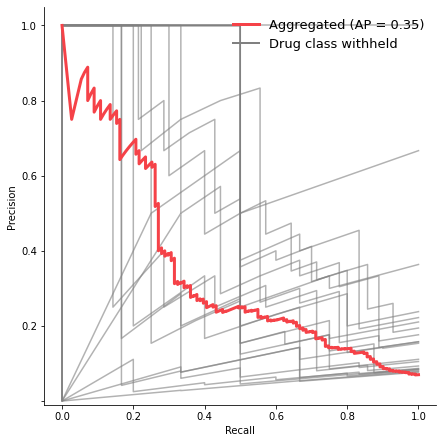

In [40]:
from matplotlib.lines import Line2D
fig, ax = plt.subplots(figsize=(6.5,6.5))

font = {'family': 'normal',
        'weight': 'normal',
        'size': 18}
matplotlib.rc('font', **font)
for cl in keys:
    plt.plot(pr.recall[cl][1], pr.precision[cl][1],
             color='grey', lw=1.5, alpha=0.6)
    plt.xlim([-0.05, 1.05])
plt.plot(recall_micro, prec_micro,
        label='Aggregated (AP = {0:0.2f})'
               ''.format(ap_micro),
         color='#f54248', linestyle='-', linewidth=3)

handles, labels = ax.get_legend_handles_labels()
patch = Line2D([0], [0], color='grey', linewidth=2, linestyle="-",
               label='Drug class withheld')
handles.append(patch) 
plt.ylim([-0.01, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
#ax.yaxis.get_major_ticks()[0].label1.set_visible(False)
ax.yaxis.get_major_ticks()[1].label1.set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#plt.title(title)
plt.legend(handles=handles, loc='upper right', prop={"size": 13},
          frameon=False)
plt.tight_layout()
#plt.savefig('Ecoli-antagonism-vs-rest-grey.pdf')

In [41]:
# A "micro-average": quantifying score on all classes jointly
prec_micro, recall_micro, _ = precision_recall_curve(pred_vs_true['syn'].values,
                                                    pred_vs_true['score_syn'].values)
ap_micro = average_precision_score(pred_vs_true['syn'].values,
                                   pred_vs_true['score_syn'].values,
                                   average="micro")

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


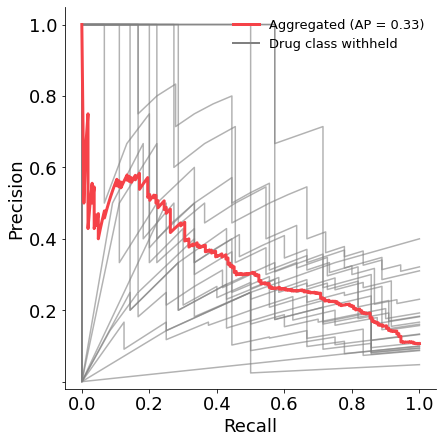

In [42]:
fig, ax = plt.subplots(figsize=(6.5,6.5))
for cl in keys:
    plt.plot(pr.recall[cl][2], pr.precision[cl][2],
            color='grey', lw=1.5, alpha=0.6)
    plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.plot(recall_micro, prec_micro,
        label='Aggregated (AP = {0:0.2f})'
               ''.format(ap_micro),
         color='#f54248', linestyle='-', linewidth=3)

handles, labels = ax.get_legend_handles_labels()
patch = Line2D([0], [0], color='grey', linewidth=2, linestyle="-",
               label='Drug class withheld')
handles.append(patch) 
plt.ylim([-0.02, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
ax.yaxis.get_major_ticks()[1].label1.set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#plt.title(title)
plt.legend(handles=handles, loc='upper right',
           prop={"size": 13},
            #bbox_to_anchor=(1.2,0.8),
          frameon=False)
#plt.legend([], frameon=False)
plt.tight_layout()
#plt.savefig('Ecoli-synergy-vs-rest-grey.pdf')

Plot ROC curves:

In [43]:
fpr_micro, tpr_micro, _ = roc_curve(pred_vs_true['ant'].values,
                                                    pred_vs_true['score_antag'].values)
roc_auc_micro = auc(fpr_micro, tpr_micro)

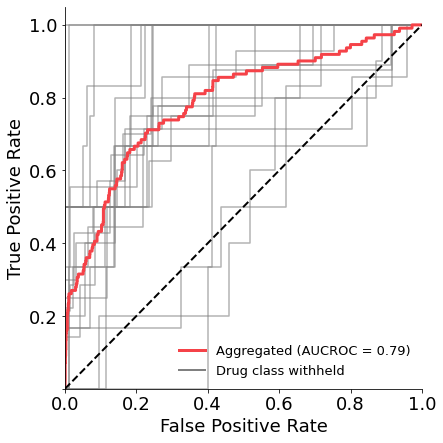

In [44]:
fig, ax = plt.subplots(figsize=(6.5,6.5))
for cl in keys:
    plt.plot(pr.fpr[cl][1], pr.tpr[cl][1],
             color='grey', lw=1.5, alpha=0.6)
plt.plot(fpr_micro, tpr_micro,
        label='Aggregated (AUCROC = {0:0.2f})'
               ''.format(roc_auc_micro),
         color='#f54248', linestyle='-', linewidth=3)

handles, labels = ax.get_legend_handles_labels()
patch = Line2D([0], [0], color='grey', linewidth=2, linestyle="-",
               label='Drug class withheld')
handles.append(patch) 
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
ax.yaxis.get_major_ticks()[0].label1.set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.legend(handles=handles, loc='lower right', prop={"size": 13},
          frameon=False)
plt.tight_layout()
#plt.savefig('Ecoli-ROC-antagonism-vs-rest-grey.pdf')

In [45]:
fpr_micro, tpr_micro, _ = roc_curve(pred_vs_true['syn'].values,
                                                    pred_vs_true['score_syn'].values)
roc_auc_micro = auc(fpr_micro, tpr_micro)

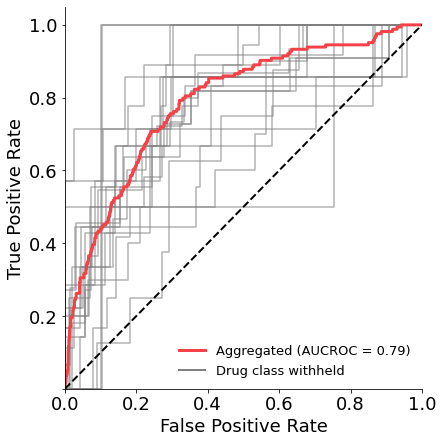

In [46]:
fig, ax = plt.subplots(figsize=(6.5,6.5))
for cl in keys:
    plt.plot(pr.fpr[cl][2], pr.tpr[cl][2],
             color='grey', lw=1.5, alpha=0.6)
plt.plot(fpr_micro, tpr_micro,
        label='Aggregated (AUCROC = {0:0.2f})'
               ''.format(roc_auc_micro),
         color='#f54248', linestyle='-', linewidth=3)

handles, labels = ax.get_legend_handles_labels()
patch = Line2D([0], [0], color='grey', linewidth=2, linestyle="-",
               label='Drug class withheld')
handles.append(patch) 
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
#ax.xaxis.get_major_ticks()[0].label1.set_visible(False)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.yaxis.get_major_ticks()[0].label1.set_visible(False)
plt.legend(handles=handles, loc='lower right', prop={"size": 13},
          frameon=False)
plt.tight_layout()
#plt.savefig('Ecoli-ROC-synergy-vs-rest-grey.pdf')

Plot average precision (AP) vs interaction rate for each cross-validation fold:

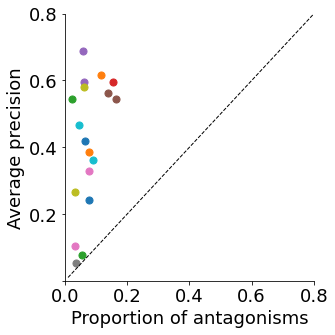

In [47]:
fig, ax = plt.subplots(figsize=(5,5))
# for antagonism predictions
for cl in keys:
    ycl = y[np.isin(combs, pr.predicted[cl]['comb'].values)].argmax(axis=1)
    antag_rate = np.sum(ycl == 1) / ycl.size
    plt.scatter(antag_rate, pr.avprec[cl][1], marker='o', 
             label=cl, s=50)
    plt.xlim((0,0.8))
    plt.ylim((0,0.8))
plt.plot([0.01, 1], [0.01, 1], 'k--', lw=1)
plt.xlabel('Proportion of antagonisms')
plt.ylabel('Average precision')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.yaxis.get_major_ticks()[0].label1.set_visible(False)
plt.tight_layout()
#plt.savefig('Ecoli-AP-antag-vs-rate.pdf')

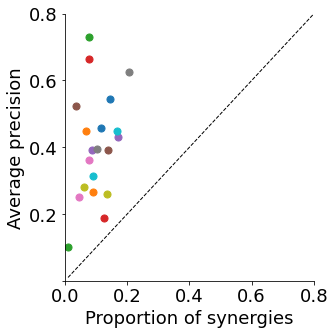

In [48]:
fig, ax = plt.subplots(figsize=(5,5))
# for antagonism predictions
for cl in keys:
    ycl = y[np.isin(combs, pr.predicted[cl]['comb'].values)].argmax(axis=1)
    syn_rate = np.sum(ycl == 2) / ycl.size
    plt.scatter(syn_rate, pr.avprec[cl][2], marker='o', 
             label=cl, s=50)
    plt.xlim((0,0.8))
    plt.ylim((0,0.8))
plt.plot([0.01, 1], [0.01, 1], 'k--', lw=1)
plt.xlabel('Proportion of synergies')
plt.ylabel('Average precision')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.yaxis.get_major_ticks()[0].label1.set_visible(False)
plt.tight_layout()
#plt.savefig('Ecoli-AP-syn-vs-rate.pdf')

<a id="calib"></a> 
## Probability calibration

In [49]:
#Ecoli{'steps': 64, 'nodes': 256, 'learning_rate_deep': 0.0001, 'layers': 1, 'epochs': 600, 'dropout': 0.5, 'beta_2': 0.999, 'beta_1': 0.8}
#Salmonella#Salmonella{'steps': 128, 'nodes': 256, 'learning_rate_deep': 0.0001, 'layers': 1, 'epochs': 600, 'dropout': 0.1, 'beta_2': 0.999, 'beta_1': 0.8}
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dropout, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D
def build_nn(dropout=0.1, nodes=256, layers=1, learning_rate_deep=0.0001, steps=128, beta_1=0.8, beta_2=0.999):
    model = Sequential()
    for i in range(layers):
        #With BN
        #model.add(Dense(self.nodes, activation="linear", use_bias="False"))
        #model.add(BatchNormalization())
        #model.add(Activation("relu"))
        #model.add(Dropout(self.dropout))
        #Without BN
        model.add(Dense(nodes, activation="relu"))
        model.add(Dropout(dropout))
        model.add(Dense(3, activation="softmax"))
                
        opt = keras.optimizers.Adam(learning_rate=learning_rate_deep, beta_1=beta_1, beta_2=beta_2)
        model.compile(loss = tf.keras.losses.SparseCategoricalCrossentropy(), optimizer = opt,  metrics = ["accuracy"]) #other option loss = "binary_crossentropy"
        return model

In [50]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
#clf = OneVsRestClassifier(RandomForestClassifier(bootstrap=True,
#                                                max_features='sqrt',
#                                                **param_dict,
#                                                random_state=2305,
#                                              n_jobs=-1))
clf = OneVsRestClassifier(tf.keras.wrappers.scikit_learn.KerasClassifier(build_nn, epochs=600, steps=128))

In [51]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X_onehot, y, test_size=0.2,
                                                    random_state=2305,
                                                    stratify=np.argmax(y, axis=1))

In [52]:
#clf = clf.fit(X_train, y_train)
clf= clf.fit(X_train, y_train)

Epoch 1/600
50/50 [==============================] - 0s 2ms/step - loss: 0.6174 - accuracy: 0.7628
Epoch 2/600
50/50 [==============================] - 0s 1ms/step - loss: 0.4149 - accuracy: 0.8496
Epoch 3/600
50/50 [==============================] - 0s 1ms/step - loss: 0.3807 - accuracy: 0.8434
Epoch 4/600
50/50 [==============================] - 0s 1ms/step - loss: 0.3726 - accuracy: 0.8483
Epoch 5/600
50/50 [==============================] - 0s 1ms/step - loss: 0.3991 - accuracy: 0.8288
Epoch 6/600
50/50 [==============================] - 0s 1ms/step - loss: 0.3338 - accuracy: 0.8628
Epoch 7/600
50/50 [==============================] - 0s 1ms/step - loss: 0.3163 - accuracy: 0.8738
Epoch 8/600
50/50 [==============================] - 0s 2ms/step - loss: 0.3176 - accuracy: 0.8618
Epoch 9/600
50/50 [==============================] - 0s 1ms/step - loss: 0.3085 - accuracy: 0.8685
Epoch 10/600
50/50 [==============================] - 0s 1ms/step - loss: 0.2951 - accuracy: 0.8814
Epoch 11/

In [53]:
probas_ = clf.predict(X_val)

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Plot precision-recall for the training set:

In [54]:
fpr = dict()
tpr = dict()
roc_auc = dict()
precision = dict()
recall = dict()
thresh = dict()
average_precision = dict()

In [55]:
n_classes = 3
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val[:, i], probas_[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    precision[i], recall[i], thresh[i] = precision_recall_curve(y_val[:, i],
                                                        probas_[:, i])
    average_precision[i] = average_precision_score(y_val[:, i], probas_[:, i])


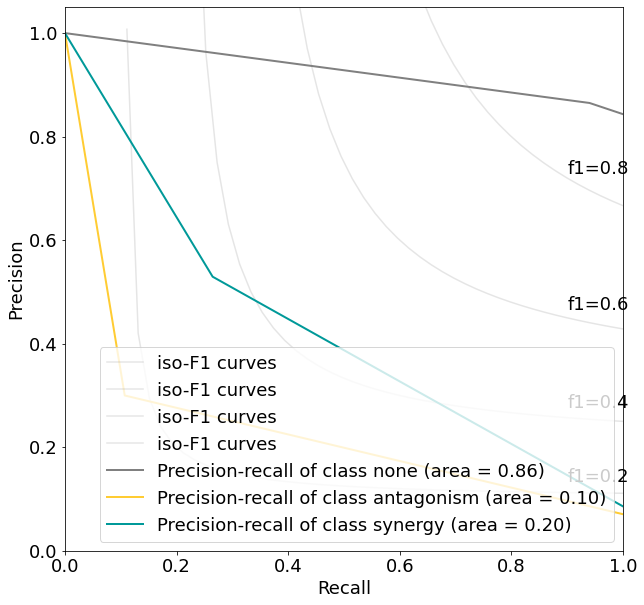

In [56]:
from itertools import cycle
class_names = ['none', 'antagonism', 'synergy']
colors = cycle(['#808080','#FFCC33', '#009999'])


plt.figure(figsize=(10,10))
f_scores = np.linspace(0.2, 0.8, num=4)

for f_score in f_scores:
    x = np.linspace(0.01, 1)
    y_ = f_score * x / (2 * x - f_score)
    plt.plot(x[y_ >= 0], y_[y_ >= 0], color='gray', alpha=0.2,
             label='iso-F1 curves')
    plt.annotate('f1={0:0.1f}'.format(f_score), xy=(0.9, y_[45] + 0.02))
for i, color in zip(range(n_classes), colors):
    plt.plot(recall[i], precision[i], color=color, lw=2,
             label='Precision-recall of class {0} (area = {1:0.2f})'
             ''.format(class_names[i], average_precision[i]))

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower right")

In [57]:
from sklearn.calibration import calibration_curve
fraction_of_positives = dict()
mean_predicted_value = dict()
for i in range(n_classes):
    proba_val = clf.predict_proba(X_val)[:, i]
    fraction_of_positives[i], mean_predicted_value[i] = calibration_curve(y_val[:,i],
                                                                proba_val,
                                                                n_bins=6)

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Sci

In [58]:
mean_predicted_value[2]

array([0.00381445, 0.23302982, 0.57117838, 0.75797445, 0.95716817])

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


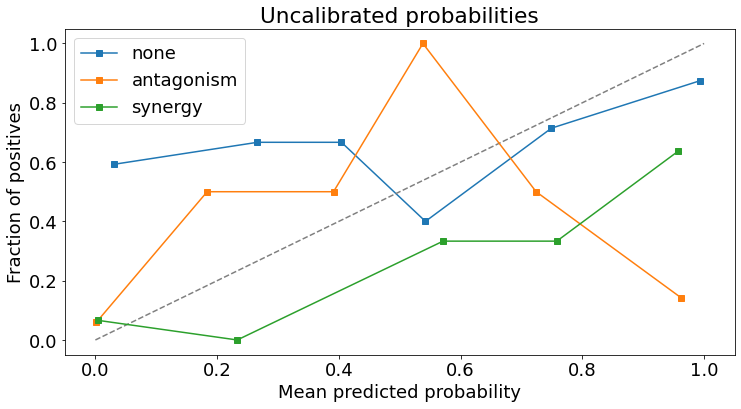

In [59]:
fig, ax = plt.subplots(1, figsize=(12, 6))
plt.plot(mean_predicted_value[0], fraction_of_positives[0], 's-', label='none')
plt.plot([0, 1], [0, 1], '--', color='gray')
plt.plot(mean_predicted_value[1], fraction_of_positives[1], 's-', label='antagonism')
plt.plot(mean_predicted_value[2], fraction_of_positives[2], 's-', label='synergy')
plt.xlabel('Mean predicted probability')
plt.ylabel('Fraction of positives')
plt.title('Uncalibrated probabilities')
plt.legend()

In [60]:
from sklearn.calibration import CalibratedClassifierCV
fraction_of_positives = dict()
mean_predicted_value = dict()
for i in range(n_classes):
    #proba_val = clf.predict_proba(X_val)[:, i]
#    clf_calib = CalibratedClassifierCV(clf.estimators_[i], cv=10, method='isotonic')
    clf_calib = CalibratedClassifierCV(clf, cv=10, method='isotonic')
    proba_val = clf_calib.fit(X_train, y_train[:,i]).predict_proba(X_val)[:,1]
    fraction_of_positives[i], mean_predicted_value[i] = calibration_curve(y_val[:,i],
                                                                proba_val,
                                                                n_bins=5)

Epoch 1/600
45/45 [==============================] - 0s 1ms/step - loss: 0.6261 - accuracy: 0.7577
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.4073 - accuracy: 0.8488
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.4008 - accuracy: 0.8366
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3642 - accuracy: 0.8502
Epoch 5/600
45/45 [==============================] - 0s 2ms/step - loss: 0.3489 - accuracy: 0.8601
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3316 - accuracy: 0.8658
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3346 - accuracy: 0.8562
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2960 - accuracy: 0.8825
Epoch 9/600
45/45 [==============================] - 0s 2ms/step - loss: 0.3035 - accuracy: 0.8740
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3195 - accuracy: 0.8577
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.6034 - accuracy: 0.7815
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.4159 - accuracy: 0.8471
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3891 - accuracy: 0.8434
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3492 - accuracy: 0.8561
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3574 - accuracy: 0.8490
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3264 - accuracy: 0.8695
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3315 - accuracy: 0.8576
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3196 - accuracy: 0.8710
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2946 - accuracy: 0.8686
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3075 - accuracy: 0.8614
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.5412 - accuracy: 0.8393
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.4009 - accuracy: 0.8475
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3671 - accuracy: 0.8602
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3662 - accuracy: 0.8496
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3355 - accuracy: 0.8659
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3608 - accuracy: 0.8427
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3381 - accuracy: 0.8577
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3196 - accuracy: 0.8698
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3503 - accuracy: 0.8603
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3276 - accuracy: 0.8562
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.7276 - accuracy: 0.6950
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3836 - accuracy: 0.8641
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3949 - accuracy: 0.8430
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3738 - accuracy: 0.8544
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3571 - accuracy: 0.8475
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3472 - accuracy: 0.8653
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3529 - accuracy: 0.8464
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3255 - accuracy: 0.8557
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3198 - accuracy: 0.8565
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3176 - accuracy: 0.8636
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.8189 - accuracy: 0.6340
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.4079 - accuracy: 0.8499
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3834 - accuracy: 0.8530
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3558 - accuracy: 0.8621
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3727 - accuracy: 0.8404
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3926 - accuracy: 0.8374
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3250 - accuracy: 0.8658
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3218 - accuracy: 0.8661
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3072 - accuracy: 0.8746
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3035 - accuracy: 0.8784
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.6269 - accuracy: 0.7817
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.4232 - accuracy: 0.8372
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3672 - accuracy: 0.8560
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3627 - accuracy: 0.8494
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3422 - accuracy: 0.8515
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3404 - accuracy: 0.8531
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3033 - accuracy: 0.8664
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3124 - accuracy: 0.8657
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3123 - accuracy: 0.8633
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3120 - accuracy: 0.8561
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.6310 - accuracy: 0.7342
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.4337 - accuracy: 0.8346
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3749 - accuracy: 0.8643
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3836 - accuracy: 0.8382
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3493 - accuracy: 0.8573
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3607 - accuracy: 0.8346
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3409 - accuracy: 0.8575
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3268 - accuracy: 0.8669
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3205 - accuracy: 0.8633
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2918 - accuracy: 0.8808
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.6813 - accuracy: 0.6921
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.4137 - accuracy: 0.8347
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3722 - accuracy: 0.8579
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3479 - accuracy: 0.8705
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3526 - accuracy: 0.8575
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3374 - accuracy: 0.8567
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3443 - accuracy: 0.8579
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3187 - accuracy: 0.8610
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2999 - accuracy: 0.8706
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2820 - accuracy: 0.8777
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.7519 - accuracy: 0.6722
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.4005 - accuracy: 0.8512
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3686 - accuracy: 0.8570
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3639 - accuracy: 0.8569
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3464 - accuracy: 0.8602
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3413 - accuracy: 0.8551
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3198 - accuracy: 0.8647
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3356 - accuracy: 0.8555
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3323 - accuracy: 0.8630
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3294 - accuracy: 0.8566
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.7338 - accuracy: 0.6847
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3891 - accuracy: 0.8615
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.4174 - accuracy: 0.8287
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3735 - accuracy: 0.8514
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3535 - accuracy: 0.8573
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3360 - accuracy: 0.8627
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3114 - accuracy: 0.8609
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3063 - accuracy: 0.8793
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3207 - accuracy: 0.8773
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3194 - accuracy: 0.8651
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Sci

Epoch 1/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3054 - accuracy: 0.9401
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1923 - accuracy: 0.9441
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2254 - accuracy: 0.9309
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1894 - accuracy: 0.9349
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1781 - accuracy: 0.9344
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1715 - accuracy: 0.9400
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1709 - accuracy: 0.9319
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1717 - accuracy: 0.9327
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1649 - accuracy: 0.9380
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1380 - accuracy: 0.9460
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.3439 - accuracy: 0.9257
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2381 - accuracy: 0.9202
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2089 - accuracy: 0.9305
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1848 - accuracy: 0.9386
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1775 - accuracy: 0.9340
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1939 - accuracy: 0.9304
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1530 - accuracy: 0.9398
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1789 - accuracy: 0.9280
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1588 - accuracy: 0.9386
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1381 - accuracy: 0.9343
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.3047 - accuracy: 0.9360
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2105 - accuracy: 0.9362
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2358 - accuracy: 0.9235
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1749 - accuracy: 0.9373
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1918 - accuracy: 0.9346
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1936 - accuracy: 0.9318
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1760 - accuracy: 0.9366
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1486 - accuracy: 0.9498
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1651 - accuracy: 0.9395
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1535 - accuracy: 0.9459
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.3067 - accuracy: 0.9268
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2125 - accuracy: 0.9335
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1968 - accuracy: 0.9392
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1932 - accuracy: 0.9347
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1769 - accuracy: 0.9383
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1742 - accuracy: 0.9390
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1435 - accuracy: 0.9481
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1688 - accuracy: 0.9321
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1327 - accuracy: 0.9517
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1324 - accuracy: 0.9506
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.3039 - accuracy: 0.9339
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2645 - accuracy: 0.9158
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2042 - accuracy: 0.9363
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1856 - accuracy: 0.9407
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1767 - accuracy: 0.9430
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1840 - accuracy: 0.9350
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1568 - accuracy: 0.9470
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1457 - accuracy: 0.9495
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1538 - accuracy: 0.9442
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1554 - accuracy: 0.9459
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.5788 - accuracy: 0.7607
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2671 - accuracy: 0.9173
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2193 - accuracy: 0.9280
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2034 - accuracy: 0.9331
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1964 - accuracy: 0.9310
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2079 - accuracy: 0.9266
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1947 - accuracy: 0.9325
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1688 - accuracy: 0.9358
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1502 - accuracy: 0.9475
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1543 - accuracy: 0.9463
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.5511 - accuracy: 0.7832
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2195 - accuracy: 0.9376
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2271 - accuracy: 0.9329
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2027 - accuracy: 0.9366
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1779 - accuracy: 0.9411
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1835 - accuracy: 0.9358
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1825 - accuracy: 0.9348
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1750 - accuracy: 0.9368
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1591 - accuracy: 0.9443
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1565 - accuracy: 0.9482
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.4726 - accuracy: 0.8474
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2366 - accuracy: 0.9278
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2018 - accuracy: 0.9380
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2094 - accuracy: 0.9264
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1908 - accuracy: 0.9336
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1812 - accuracy: 0.9356
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1973 - accuracy: 0.9327
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1717 - accuracy: 0.9372
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1707 - accuracy: 0.9421
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1617 - accuracy: 0.9382
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.4851 - accuracy: 0.8533
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2638 - accuracy: 0.9202
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1985 - accuracy: 0.9395
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1846 - accuracy: 0.9395
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2341 - accuracy: 0.9190
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1744 - accuracy: 0.9407
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1438 - accuracy: 0.9509
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1579 - accuracy: 0.9463
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1572 - accuracy: 0.9442
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1521 - accuracy: 0.9411
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.6039 - accuracy: 0.7471
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2305 - accuracy: 0.9353
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2289 - accuracy: 0.9272
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2060 - accuracy: 0.9346
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2010 - accuracy: 0.9294
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1868 - accuracy: 0.9369
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1725 - accuracy: 0.9404
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1925 - accuracy: 0.9270
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1611 - accuracy: 0.9409
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1743 - accuracy: 0.9336
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Sci

Epoch 1/600
45/45 [==============================] - 0s 1ms/step - loss: 0.4711 - accuracy: 0.8577
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2827 - accuracy: 0.9121
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2454 - accuracy: 0.9198
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2377 - accuracy: 0.9187
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2344 - accuracy: 0.9137
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2299 - accuracy: 0.9182
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2042 - accuracy: 0.9285
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2249 - accuracy: 0.9172
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1884 - accuracy: 0.9239
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1945 - accuracy: 0.9260
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.5502 - accuracy: 0.7900
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2741 - accuracy: 0.9163
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2545 - accuracy: 0.9167
Epoch 4/600
45/45 [==============================] - 0s 2ms/step - loss: 0.2632 - accuracy: 0.9080
Epoch 5/600
45/45 [==============================] - 0s 2ms/step - loss: 0.2261 - accuracy: 0.9198
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2081 - accuracy: 0.9284
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2308 - accuracy: 0.9019
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1899 - accuracy: 0.9269
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1915 - accuracy: 0.9330
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1941 - accuracy: 0.9259
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 1s 1ms/step - loss: 0.8363 - accuracy: 0.6343
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.3040 - accuracy: 0.9109
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2515 - accuracy: 0.9198
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2540 - accuracy: 0.9171
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2467 - accuracy: 0.9227
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2535 - accuracy: 0.9121
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2109 - accuracy: 0.9259
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2334 - accuracy: 0.9141
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2212 - accuracy: 0.9211
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1967 - accuracy: 0.9258
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.4888 - accuracy: 0.8476
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2542 - accuracy: 0.9207
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2368 - accuracy: 0.9230
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2532 - accuracy: 0.9154
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2266 - accuracy: 0.9221
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2395 - accuracy: 0.9108
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1972 - accuracy: 0.9293
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1928 - accuracy: 0.9334
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1831 - accuracy: 0.9276
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1939 - accuracy: 0.9239
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.6479 - accuracy: 0.7233
Epoch 2/600
45/45 [==============================] - 0s 951us/step - loss: 0.2676 - accuracy: 0.9225
Epoch 3/600
45/45 [==============================] - 0s 916us/step - loss: 0.2625 - accuracy: 0.9143
Epoch 4/600
45/45 [==============================] - 0s 986us/step - loss: 0.2582 - accuracy: 0.9102
Epoch 5/600
45/45 [==============================] - 0s 985us/step - loss: 0.2423 - accuracy: 0.9166
Epoch 6/600
45/45 [==============================] - 0s 902us/step - loss: 0.2315 - accuracy: 0.9172
Epoch 7/600
45/45 [==============================] - 0s 912us/step - loss: 0.2155 - accuracy: 0.9202
Epoch 8/600
45/45 [==============================] - 0s 969us/step - loss: 0.2342 - accuracy: 0.9128
Epoch 9/600
45/45 [==============================] - 0s 901us/step - loss: 0.2105 - accuracy: 0.9149
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2006 - accuracy: 0.9244
Epoch

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.4532 - accuracy: 0.8705
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2693 - accuracy: 0.9153
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2533 - accuracy: 0.9166
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2444 - accuracy: 0.9188
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2153 - accuracy: 0.9246
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2508 - accuracy: 0.9059
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2096 - accuracy: 0.9244
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2132 - accuracy: 0.9222
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2083 - accuracy: 0.9260
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1889 - accuracy: 0.9313
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.4244 - accuracy: 0.8631
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2653 - accuracy: 0.9232
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2598 - accuracy: 0.9181
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2514 - accuracy: 0.9169
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2325 - accuracy: 0.9146
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2339 - accuracy: 0.9160
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2076 - accuracy: 0.9192
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2151 - accuracy: 0.9239
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2012 - accuracy: 0.9301
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1900 - accuracy: 0.9251
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.7316 - accuracy: 0.6802
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2965 - accuracy: 0.9173
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2751 - accuracy: 0.9112
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2513 - accuracy: 0.9189
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2421 - accuracy: 0.9171
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2196 - accuracy: 0.9206
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2327 - accuracy: 0.9216
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2083 - accuracy: 0.9219
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2223 - accuracy: 0.9190
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2223 - accuracy: 0.9154
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.4962 - accuracy: 0.7885
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2849 - accuracy: 0.9109
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2833 - accuracy: 0.9060
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2431 - accuracy: 0.9167
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2262 - accuracy: 0.9271
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2343 - accuracy: 0.9165
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2244 - accuracy: 0.9219
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2034 - accuracy: 0.9230
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1931 - accuracy: 0.9286
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1991 - accuracy: 0.9229
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


45/45 [==============================] - 0s 1ms/step - loss: 0.5522 - accuracy: 0.7845
Epoch 2/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2655 - accuracy: 0.9252
Epoch 3/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2557 - accuracy: 0.9164
Epoch 4/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2589 - accuracy: 0.9109
Epoch 5/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2587 - accuracy: 0.9063
Epoch 6/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2504 - accuracy: 0.9117
Epoch 7/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2040 - accuracy: 0.9256
Epoch 8/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1984 - accuracy: 0.9300
Epoch 9/600
45/45 [==============================] - 0s 1ms/step - loss: 0.1930 - accuracy: 0.9238
Epoch 10/600
45/45 [==============================] - 0s 1ms/step - loss: 0.2011 - accuracy: 0.9246
Epoch 11/600
45/45 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Sci

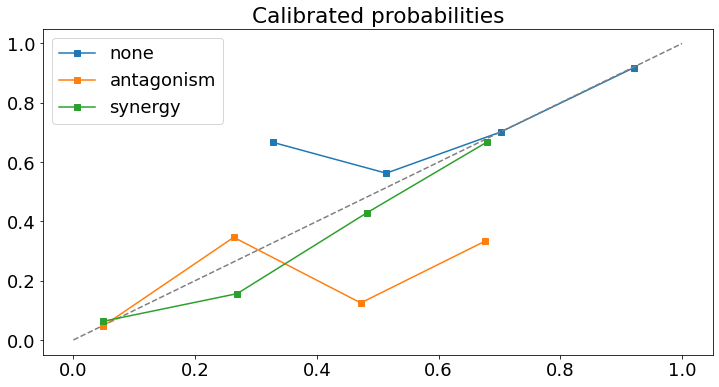

In [61]:
fig, ax = plt.subplots(1, figsize=(12, 6))
plt.plot(mean_predicted_value[0], fraction_of_positives[0], 's-', label='none')
plt.plot([0, 1], [0, 1], '--', color='gray')
plt.plot(mean_predicted_value[1], fraction_of_positives[1], 's-', label='antagonism')
plt.plot(mean_predicted_value[2], fraction_of_positives[2], 's-', label='synergy')
plt.title('Calibrated probabilities')
plt.legend()

Somehow probability calibration doesn't work for synergy prediction

<a id="test"></a> 
## Generate Predictions on the Test Set

In [62]:
#X_drugs = pd.read_csv('../data/chemgenetics/nichols_testset_signed.csv', index_col=0)
X_drugs = pd.read_csv('../data/chemgenetics/salmonella_testset_signed.csv', index_col=0)

In [63]:
X_drugs = X_drugs.iloc[:,np.where(np.isin(X_drugs.columns, gene_subset))[0]]

In [64]:
X_drugs.shape

(76, 313)

In [65]:
test_drugs = X_drugs.index.values

In [66]:
combs_test = list(itertools.combinations(test_drugs, 2))
combs_test = np.array([i[0]+"_"+i[1] for i in combs_test])

In [67]:
len(combs_test)

2850

In [68]:
X_test = pd.DataFrame([utl.get_comb_feat_signed(X_drugs, c) for c in combs_test])

In [69]:
X_test = pd.get_dummies(X_test.astype('category'))

In [70]:
X_test.iloc[:10,:12]

,acnB_-2,acnB_-1,acnB_0,acnB_1,acnB_3,acrB_-2,acrB_-1,acrB_0,ampD_0,ampD_1,ampD_2,ampE_0
0,0,1,0,0,0,0,1,0,1,0,0,1
1,0,1,0,0,0,0,1,0,1,0,0,1
2,0,1,0,0,0,1,0,0,1,0,0,1
3,0,1,0,0,0,0,1,0,1,0,0,1
4,0,1,0,0,0,0,1,0,1,0,0,1
5,1,0,0,0,0,1,0,0,1,0,0,1
6,1,0,0,0,0,0,1,0,1,0,0,1
7,0,1,0,0,0,0,1,0,1,0,0,1
8,0,1,0,0,0,0,1,0,1,0,0,1
9,0,1,0,0,0,1,0,0,1,0,0,1


Pad some columns (as some are all zeros in the test set):

In [71]:
X_test.shape

(2850, 1014)

In [72]:
cols_pad = np.setdiff1d(X_onehot.columns, X_test.columns)

In [73]:
for col in cols_pad:
    X_test[col] = 0

In [74]:
X_test = X_test.loc[:,np.isin(X_test.columns, X_onehot.columns)]

In [75]:
X_test = X_test[X_onehot.columns]

In [76]:
np.all(X_test.columns == X_onehot.columns)

True

In [77]:
# without probability calibration
y_test_proba = clf.fit(X_onehot, y).predict_proba(X_test)
antag = combs_test[y_test_proba[:,1] > antag_thresh]
syn = combs_test[y_test_proba[:,2] > syn_thresh]

Epoch 1/600
62/62 [==============================] - 0s 1ms/step - loss: 0.9150 - accuracy: 0.5911
Epoch 2/600
62/62 [==============================] - 0s 1ms/step - loss: 0.4100 - accuracy: 0.8433
Epoch 3/600
62/62 [==============================] - 0s 1ms/step - loss: 0.4014 - accuracy: 0.8426
Epoch 4/600
62/62 [==============================] - 0s 1ms/step - loss: 0.3627 - accuracy: 0.8546
Epoch 5/600
62/62 [==============================] - 0s 1ms/step - loss: 0.3781 - accuracy: 0.8422
Epoch 6/600
62/62 [==============================] - 0s 1ms/step - loss: 0.3368 - accuracy: 0.8543
Epoch 7/600
62/62 [==============================] - 0s 1ms/step - loss: 0.3581 - accuracy: 0.8433
Epoch 8/600
62/62 [==============================] - 0s 1ms/step - loss: 0.3342 - accuracy: 0.8566
Epoch 9/600
62/62 [==============================] - 0s 1ms/step - loss: 0.3391 - accuracy: 0.8566
Epoch 10/600
62/62 [==============================] - 0s 1ms/step - loss: 0.3278 - accuracy: 0.8558
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


In [78]:
np.setdiff1d(antag, syn)

array([], dtype='<U40')

In [79]:
np.setdiff1d(syn, antag)

array(['Bipyridil_Cecropinb', 'Bipyridil_Kasugamycin',
       'Bipyridil_Thiostrepton', 'Cecropinb_Kasugamycin'], dtype='<U40')

In [80]:
np.intersect1d(antag, syn)

array([], dtype='<U40')

In [81]:
prob_uncalibr = pd.DataFrame(y_test_proba, index=combs_test,
             columns=['none', 'antag', 'synergy'])

In [82]:
#prob_uncalibr.to_csv('nichols_test_pred.csv')
prob_uncalibr.to_csv('salmonella_test_pred.csv')

In [83]:
prob_uncalibr.sort_values('antag', ascending=False).iloc[:20,:]

,none,antag,synergy
Sds_Temperature,0.373176,0.472630,1.742509e-03
Cm_Nacl,0.141641,0.439974,1.069515e-04
Nacl_Pvpi,0.524539,0.304387,2.932840e-05
Defensinhnp1_Nacl,0.100166,0.300483,5.814307e-04
Articaine_Cm,0.170967,0.260329,2.084607e-04
Articaine_Tbutylhydroperoxide,0.999942,0.254280,9.726223e-08
Sanguinarine_Sds,0.999113,0.156687,1.642604e-07
Cm_Sanguinarine,0.111601,0.146358,1.185899e-05
Cm_Ctab,0.026841,0.082809,3.919182e-02
Propionate_Ramoplanin,0.999658,0.078404,1.663616e-10


In [84]:
prob_uncalibr.sort_values('synergy', ascending=False).iloc[:20,:]

,none,antag,synergy
Bipyridil_Cecropinb,0.996069,2.693822e-08,0.978773
Bipyridil_Kasugamycin,0.999805,6.734643e-11,0.977332
Cecropinb_Kasugamycin,0.911120,1.700096e-06,0.969579
Bipyridil_Thiostrepton,0.999331,1.207649e-07,0.931549
Pentamidine_Streptomycin,0.684592,3.249100e-07,0.899015
Bipyridil_Hydroxyurea,0.999997,5.437376e-11,0.865007
Bipyridil_Colicinm,0.999217,7.787590e-09,0.739278
Bipyridil_Phospholipasea2,0.999963,2.052865e-08,0.702303
Bipyridil_Cinoxacin,0.999979,2.059265e-08,0.699194
Bipyridil_Dlserinehydroxamate,0.999979,2.059265e-08,0.699194


In [85]:
from sklearn.model_selection import StratifiedKFold
skf = StratifiedKFold(n_splits=10)

# with calibration (using stratified KFold for calibrator)
probs = dict()
for i in range(n_classes):
#    clf_calib = CalibratedClassifierCV(clf.estimators_[i], cv=skf, method='isotonic')
    clf_calib = CalibratedClassifierCV(clf, cv=skf, method='isotonic')
    probs[i] = clf_calib.fit(X_onehot, y[:,i]).predict_proba(X_test)

Epoch 1/600
56/56 [==============================] - 0s 1ms/step - loss: 0.5139 - accuracy: 0.8396
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.4053 - accuracy: 0.8430
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3699 - accuracy: 0.8506
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3501 - accuracy: 0.8523
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3403 - accuracy: 0.8601
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3400 - accuracy: 0.8595
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3520 - accuracy: 0.8456
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3150 - accuracy: 0.8592
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3069 - accuracy: 0.8738
Epoch 10/600
56/56 [==============================] - 0s 2ms/step - loss: 0.3058 - accuracy: 0.8703
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.6231 - accuracy: 0.7313
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.4079 - accuracy: 0.8455
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.4068 - accuracy: 0.8404
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3545 - accuracy: 0.8573
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3378 - accuracy: 0.8631
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3398 - accuracy: 0.8561
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3269 - accuracy: 0.8626
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3166 - accuracy: 0.8742
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3023 - accuracy: 0.8758
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3068 - accuracy: 0.8666
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.6378 - accuracy: 0.7611
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.4126 - accuracy: 0.8460
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.4058 - accuracy: 0.8372
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3515 - accuracy: 0.8582
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3737 - accuracy: 0.8443
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3021 - accuracy: 0.8739
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3426 - accuracy: 0.8378
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3276 - accuracy: 0.8550
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3158 - accuracy: 0.8636
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3072 - accuracy: 0.8684
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.4832 - accuracy: 0.8475
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3790 - accuracy: 0.8605
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3598 - accuracy: 0.8631
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3709 - accuracy: 0.8485
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3417 - accuracy: 0.8593
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3244 - accuracy: 0.8688
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3278 - accuracy: 0.8573
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3129 - accuracy: 0.8686
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3283 - accuracy: 0.8647
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3154 - accuracy: 0.8620
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.6034 - accuracy: 0.7673
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3978 - accuracy: 0.8527
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3733 - accuracy: 0.8543
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3540 - accuracy: 0.8521
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3290 - accuracy: 0.8626
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3370 - accuracy: 0.8647
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3137 - accuracy: 0.8666
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3143 - accuracy: 0.8610
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3080 - accuracy: 0.8679
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3014 - accuracy: 0.8799
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.7010 - accuracy: 0.7068
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.4086 - accuracy: 0.8451
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3604 - accuracy: 0.8570
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3652 - accuracy: 0.8478
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3512 - accuracy: 0.8461
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3257 - accuracy: 0.8664
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3598 - accuracy: 0.8519
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3221 - accuracy: 0.8703
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3151 - accuracy: 0.8610
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3052 - accuracy: 0.8711
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
56/56 [==============================] - 0s 1ms/step - loss: 0.6252 - accuracy: 0.7530
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3835 - accuracy: 0.8532
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3839 - accuracy: 0.8427
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3893 - accuracy: 0.8380
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3354 - accuracy: 0.8571
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3209 - accuracy: 0.8632
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3186 - accuracy: 0.8637
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3292 - accuracy: 0.8635
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3142 - accuracy: 0.8597
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3097 - accuracy: 0.8723
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.7638 - accuracy: 0.6397
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3943 - accuracy: 0.8561
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3691 - accuracy: 0.8568
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3497 - accuracy: 0.8582
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3408 - accuracy: 0.8666
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3204 - accuracy: 0.8640
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3106 - accuracy: 0.8697
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3253 - accuracy: 0.8615
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3038 - accuracy: 0.8692
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2744 - accuracy: 0.8849
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.4843 - accuracy: 0.8352
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3782 - accuracy: 0.8518
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3468 - accuracy: 0.8621
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3404 - accuracy: 0.8609
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3243 - accuracy: 0.8624
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3164 - accuracy: 0.8632
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3196 - accuracy: 0.8605
Epoch 8/600
56/56 [==============================] - 0s 2ms/step - loss: 0.3155 - accuracy: 0.8660
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2962 - accuracy: 0.8717
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2849 - accuracy: 0.8819
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.6382 - accuracy: 0.7346
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3617 - accuracy: 0.8647
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3648 - accuracy: 0.8597
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3752 - accuracy: 0.8525
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3521 - accuracy: 0.8539
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3265 - accuracy: 0.8685
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3256 - accuracy: 0.8590
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3083 - accuracy: 0.8759
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3013 - accuracy: 0.8665
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3109 - accuracy: 0.8644
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Sci

Epoch 1/600
56/56 [==============================] - 0s 1ms/step - loss: 0.5223 - accuracy: 0.8011
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2284 - accuracy: 0.9254
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2109 - accuracy: 0.9318
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1943 - accuracy: 0.9337
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1824 - accuracy: 0.9393
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2029 - accuracy: 0.9314
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1712 - accuracy: 0.9412
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1622 - accuracy: 0.9408
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1589 - accuracy: 0.9405
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1446 - accuracy: 0.9472
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.4132 - accuracy: 0.8801
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2439 - accuracy: 0.9248
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1779 - accuracy: 0.9444
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1871 - accuracy: 0.9339
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1675 - accuracy: 0.9495
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1786 - accuracy: 0.9355
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1572 - accuracy: 0.9432
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1589 - accuracy: 0.9467
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1570 - accuracy: 0.9441
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1596 - accuracy: 0.9414
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.5742 - accuracy: 0.7562
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2188 - accuracy: 0.9342
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2254 - accuracy: 0.9239
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2124 - accuracy: 0.9287
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1826 - accuracy: 0.9367
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1851 - accuracy: 0.9338
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1684 - accuracy: 0.9396
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1773 - accuracy: 0.9351
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1627 - accuracy: 0.9408
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1636 - accuracy: 0.9376
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.5329 - accuracy: 0.7720
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2296 - accuracy: 0.9356
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2076 - accuracy: 0.9345
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2034 - accuracy: 0.9301
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2023 - accuracy: 0.9257
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1605 - accuracy: 0.9425
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1536 - accuracy: 0.9454
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1649 - accuracy: 0.9421
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1522 - accuracy: 0.9454
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1694 - accuracy: 0.9380
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.4958 - accuracy: 0.8394
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2204 - accuracy: 0.9349
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2280 - accuracy: 0.9285
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2145 - accuracy: 0.9280
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1859 - accuracy: 0.9377
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1446 - accuracy: 0.9491
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1868 - accuracy: 0.9327
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1571 - accuracy: 0.9395
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1628 - accuracy: 0.9420
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1695 - accuracy: 0.9385
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.3927 - accuracy: 0.9031
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2482 - accuracy: 0.9228
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2257 - accuracy: 0.9257
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2118 - accuracy: 0.9287
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2139 - accuracy: 0.9291
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1699 - accuracy: 0.9383
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2060 - accuracy: 0.9281
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1740 - accuracy: 0.9337
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1652 - accuracy: 0.9374
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1616 - accuracy: 0.9437
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.4903 - accuracy: 0.8390
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2439 - accuracy: 0.9240
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2036 - accuracy: 0.9334
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2137 - accuracy: 0.9311
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1710 - accuracy: 0.9402
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1776 - accuracy: 0.9391
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1696 - accuracy: 0.9364
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1700 - accuracy: 0.9409
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1459 - accuracy: 0.9477
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1559 - accuracy: 0.9385
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.4756 - accuracy: 0.8314
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2043 - accuracy: 0.9366
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2165 - accuracy: 0.9208
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1773 - accuracy: 0.9388
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1534 - accuracy: 0.9496
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1679 - accuracy: 0.9373
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1761 - accuracy: 0.9403
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1395 - accuracy: 0.9504
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1390 - accuracy: 0.9503
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1409 - accuracy: 0.9489
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.6020 - accuracy: 0.7332
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2408 - accuracy: 0.9299
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1805 - accuracy: 0.9443
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1890 - accuracy: 0.9396
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1902 - accuracy: 0.9407
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1937 - accuracy: 0.9237
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1635 - accuracy: 0.9402
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1673 - accuracy: 0.9393
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1599 - accuracy: 0.9431
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1471 - accuracy: 0.9441
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.4313 - accuracy: 0.8594
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2112 - accuracy: 0.9347
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2322 - accuracy: 0.9217
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1893 - accuracy: 0.9338
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1758 - accuracy: 0.9379
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1490 - accuracy: 0.9500
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1715 - accuracy: 0.9387
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1649 - accuracy: 0.9374
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1610 - accuracy: 0.9349
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1326 - accuracy: 0.9560
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Sci

Epoch 1/600
56/56 [==============================] - 0s 1ms/step - loss: 0.6451 - accuracy: 0.7278
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2615 - accuracy: 0.9240
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2937 - accuracy: 0.8954
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2709 - accuracy: 0.9105
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2630 - accuracy: 0.9081
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2192 - accuracy: 0.9205
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2032 - accuracy: 0.9286
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2015 - accuracy: 0.9212
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2246 - accuracy: 0.9178
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2069 - accuracy: 0.9208
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.4289 - accuracy: 0.8931
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2812 - accuracy: 0.9142
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2591 - accuracy: 0.9185
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2384 - accuracy: 0.9246
Epoch 5/600
56/56 [==============================] - 0s 2ms/step - loss: 0.2275 - accuracy: 0.9210
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2077 - accuracy: 0.9282
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2206 - accuracy: 0.9221
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2175 - accuracy: 0.9252
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1977 - accuracy: 0.9253
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2126 - accuracy: 0.9221
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.7755 - accuracy: 0.6470
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3243 - accuracy: 0.9036
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2589 - accuracy: 0.9220
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2492 - accuracy: 0.9137
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2313 - accuracy: 0.9220
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2418 - accuracy: 0.9154
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2337 - accuracy: 0.9119
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2121 - accuracy: 0.9204
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2197 - accuracy: 0.9168
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2047 - accuracy: 0.9266
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.3930 - accuracy: 0.9055
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2684 - accuracy: 0.9190
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2418 - accuracy: 0.9188
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2177 - accuracy: 0.9240
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2427 - accuracy: 0.9137
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2383 - accuracy: 0.9070
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2111 - accuracy: 0.9213
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1969 - accuracy: 0.9242
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2056 - accuracy: 0.9257
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1913 - accuracy: 0.9292
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.5362 - accuracy: 0.7889
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2943 - accuracy: 0.9163
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2648 - accuracy: 0.9175
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2640 - accuracy: 0.9131
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2385 - accuracy: 0.9145
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2381 - accuracy: 0.9146
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2272 - accuracy: 0.9199
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2184 - accuracy: 0.9219
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2110 - accuracy: 0.9200
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2056 - accuracy: 0.9225
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.3636 - accuracy: 0.9069
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2622 - accuracy: 0.9195
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2344 - accuracy: 0.9189
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2315 - accuracy: 0.9161
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2435 - accuracy: 0.9081
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2038 - accuracy: 0.9256
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2029 - accuracy: 0.9261
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1934 - accuracy: 0.9251
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1863 - accuracy: 0.9274
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1820 - accuracy: 0.9311
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.6719 - accuracy: 0.7103
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2774 - accuracy: 0.9163
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2659 - accuracy: 0.9122
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2473 - accuracy: 0.9163
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2368 - accuracy: 0.9153
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2415 - accuracy: 0.9091
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2301 - accuracy: 0.9117
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1980 - accuracy: 0.9228
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1961 - accuracy: 0.9226
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1752 - accuracy: 0.9328
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.6171 - accuracy: 0.7350
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2792 - accuracy: 0.9128
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2732 - accuracy: 0.9070
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2238 - accuracy: 0.9282
Epoch 5/600
56/56 [==============================] - 0s 891us/step - loss: 0.2318 - accuracy: 0.9180
Epoch 6/600
56/56 [==============================] - 0s 905us/step - loss: 0.2187 - accuracy: 0.9201
Epoch 7/600
56/56 [==============================] - 0s 895us/step - loss: 0.2193 - accuracy: 0.9129
Epoch 8/600
56/56 [==============================] - 0s 929us/step - loss: 0.2100 - accuracy: 0.9201
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1917 - accuracy: 0.9269
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1929 - accuracy: 0.9281
Epoch 11/600


/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 1ms/step - loss: 0.3782 - accuracy: 0.9051
Epoch 2/600
56/56 [==============================] - 0s 1ms/step - loss: 0.3080 - accuracy: 0.9004
Epoch 3/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2559 - accuracy: 0.9163
Epoch 4/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2401 - accuracy: 0.9218
Epoch 5/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2167 - accuracy: 0.9192
Epoch 6/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2234 - accuracy: 0.9161
Epoch 7/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2195 - accuracy: 0.9122
Epoch 8/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2122 - accuracy: 0.9203
Epoch 9/600
56/56 [==============================] - 0s 1ms/step - loss: 0.2174 - accuracy: 0.9162
Epoch 10/600
56/56 [==============================] - 0s 1ms/step - loss: 0.1987 - accuracy: 0.9238
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


56/56 [==============================] - 0s 2ms/step - loss: 0.4846 - accuracy: 0.8482
Epoch 2/600
56/56 [==============================] - 0s 2ms/step - loss: 0.2782 - accuracy: 0.9140
Epoch 3/600
56/56 [==============================] - 0s 2ms/step - loss: 0.2737 - accuracy: 0.9100
Epoch 4/600
56/56 [==============================] - 0s 2ms/step - loss: 0.2413 - accuracy: 0.9202
Epoch 5/600
56/56 [==============================] - 0s 2ms/step - loss: 0.2145 - accuracy: 0.9240
Epoch 6/600
56/56 [==============================] - 0s 2ms/step - loss: 0.2322 - accuracy: 0.9113
Epoch 7/600
56/56 [==============================] - 0s 2ms/step - loss: 0.2248 - accuracy: 0.9158
Epoch 8/600
56/56 [==============================] - 0s 2ms/step - loss: 0.2184 - accuracy: 0.9214
Epoch 9/600
56/56 [==============================] - 0s 2ms/step - loss: 0.1992 - accuracy: 0.9220
Epoch 10/600
56/56 [==============================] - 0s 2ms/step - loss: 0.2146 - accuracy: 0.9166
Epoch 11/600
56/56 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Sci

In [86]:
# antagonisms based on calibrated probabilities
combs_test[probs[1][:,1] > 0.4]

array([], dtype='<U40')

In [87]:
# synergies based on calibrated probabilities
combs_test[probs[2][:,1] > 0.4]

array(['Bipyridil_Cecropinb', 'Bipyridil_Kasugamycin',
       'Kasugamycin_Temperature', 'Nalidixicacid_Ramoplanin',
       'Pentamidine_Streptomycin', 'Pvpi_Temperature',
       'Streptomycin_Temperature'], dtype='<U40')

In [88]:
'''df = pd.DataFrame(dict(antag=probs[1][:,1], synergy=probs[2][:,1], none=probs[0][:,1]))
df.index = combs_test
np.all(df.idxmax(axis=1).values == 'none')'''

"df = pd.DataFrame(dict(antag=probs[1][:,1], synergy=probs[2][:,1], none=probs[0][:,1]))\ndf.index = combs_test\nnp.all(df.idxmax(axis=1).values == 'none')"